<a href="https://colab.research.google.com/github/cathemesquita/Colab_notebooks/blob/main/PROJETO_LH_PFC_PSD_E_ESPEC_ATIVO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

MessageError: Error: credential propagation was unsuccessful

> # BIBLIOTECAS

In [ ]:
from IPython.display import clear_output

In [ ]:
pip install open-ephys-python-tools

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 381.8/381.8 kB 2.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
  Preparing metadata (setup.py) ... done
  Created wheel for open-ephys-python-tools: filename=open_ephys_python_tools-0.1.7-py3-none-any.whl size=39989 sha256=e8789bb69440e443915045c1044c487a093bb067eebf9d61244844e97872b5af
  Stored in directory: /root/.cache/pip/wheels/99/0a/29/c0d2d399ff078b2a96c61e36a0a219a8fbb545a7acd261ce80
  Created wheel for zmq: filename=zmq-0.0.0-py3-none-any.whl size=1264 sha256=451b7e761d46cdfdd76688c071645955bf4f816ebb2dd655a2006ef35e48a9b4
  Stored in directory: /root/.cache/pip/wheels/ab/c5/fe/d853f71843cae26c123d37a7a5934baac20fc66f35a913951d
Successfully built open-ephys-python-tools zmq


In [ ]:
! pip install pactools

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.7/82.7 kB 1.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.3/8.3 MB 16.6 MB/s eta 0:00:00


In [ ]:
from open_ephys.analysis import Session

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib as mpl
import numpy as np
import pandas as pd


from scipy import signal
import math
from scipy.signal import welch, spectrogram, coherence, find_peaks, firwin, lfilter, filtfilt, hilbert
import seaborn as sn

from statsmodels.tsa.stattools import grangercausalitytests
from scipy import stats
from scipy.stats import wilcoxon

import math
import time as ttime
from numpy.fft import fft, ifft, rfft, fftfreq
from scipy.signal import firwin, lfilter, filtfilt
from scipy.io import loadmat

import pactools
from pactools import Comodulogram, REFERENCES

import os
from PIL import Image
from scipy import signal



import seaborn as sns

<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen impo

> # FUNÇÕES



In [ ]:
def prewiew(path):
  load = Session(path).recordnodes[0].recordings[0]
  t_raw= load.continuous[0].timestamps
  t = t_raw-t_raw[0]

  data = pd.DataFrame(load.continuous[0].get_samples(start_sample_index=0, end_sample_index=len(t)))

  srate = 1000
  fc_low = 45
  fc_high = 65
  order = 3
  b, a = signal.butter(order, [fc_low/(0.5*srate), fc_high/(0.5*srate)], btype='bandstop')

  data_filt = signal.filtfilt(b, a, data)

  return (pd.DataFrame(data_filt))


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
def preview_plot(data):

  for i in range(0,32):
    plt.figure()
    plt.plot(data[i])
    plt.title('ch' + str (i+1))

In [ ]:
def contador_de_tempo(data_para_contar):
  total_time = 0
  for i in range(len(data_para_contar)):
    total_time = total_time+ len(data_para_contar[i])/srate

  return total_time

In [ ]:
# CARREGAR O DADO COMPLETO

def load_data_full(path,ch_prl,ch_cg,ch_il):
  load = Session(path).recordnodes[0].recordings[0]
  t_raw= load.continuous[0].timestamps
  t = t_raw-t_raw[0]

  # tive que ecolher esse len pq o CCM559 tinha 30 min de dado, então padronizei p todos 10min
  data_prl = pd.DataFrame(load.continuous[0].get_samples(start_sample_index=0, end_sample_index=len(t))).iloc[:,int(int(ch_prl)-1)]
  data_cg = pd.DataFrame(load.continuous[0].get_samples(start_sample_index=0, end_sample_index=len(t))).iloc[:,int(int(ch_cg)-1)]
  data_il = pd.DataFrame(load.continuous[0].get_samples(start_sample_index=0, end_sample_index=len(t))).iloc[:,int(int(ch_il)-1)]


  srate = 1000
  fc_low = 59
  fc_high = 61
  order = 5
  b, a = signal.butter(order, [fc_low/(0.5*srate), fc_high/(0.5*srate)], btype='bandstop')

  PRL = signal.filtfilt(b, a, data_prl)
  CG = signal.filtfilt(b, a, data_cg)
  IL = signal.filtfilt(b, a, data_il)

  return(pd.DataFrame({'data_PRL': PRL,'data_CG': CG, 'data_IL': IL}))

In [ ]:
# CARREGAR OS DADOS DO ACELEROMETRO

def load_acelerometer(path):
    load = Session(path).recordnodes[0].recordings[0]
    t_raw = load.continuous[0].timestamps
    t = t_raw - t_raw[0]

    x = pd.DataFrame(load.continuous[0].get_samples(start_sample_index=0, end_sample_index=len(t))).iloc[:, 32]
    y = pd.DataFrame(load.continuous[0].get_samples(start_sample_index=0, end_sample_index=len(t))).iloc[:, 33]
    z = pd.DataFrame(load.continuous[0].get_samples(start_sample_index=0, end_sample_index=len(t))).iloc[:, 34]

    x = np.array(x)
    y = np.array(y)
    z = np.array(z)
    acel = np.abs(np.sqrt(x**2 + y**2 + z**2))

    df_acel = pd.DataFrame({'acel': acel})
    df_acel['animal'] = str(rato)
    df_acel['condicao'] = str(condicao)

    return df_acel

In [ ]:
def generating_masks_parado(path,ch,regiao): #ANIMAL PARADO

  load = Session(path).recordnodes[0].recordings[0]
  t_raw= load.continuous[0].timestamps
  t = t_raw-t_raw[0]

  data = pd.DataFrame(load.continuous[0].get_samples(start_sample_index=0, end_sample_index=len(t))).iloc[:,int(int(ch)-1)]

  srate = 1000
  fc_low = 59
  fc_high = 61
  order = 5
  b, a = signal.butter(order, [fc_low/(0.5*srate), fc_high/(0.5*srate)], btype='bandstop')

  DATA = signal.filtfilt(b, a, data)

  # Recuperando dado da acelerometria para definir momentos de atividade
  data_acel = df_acel[(df_acel['animal'] == str(rato) ) & (df_acel['condicao'] == str(condicao))]['acel']

  acel = np.array(data_acel)
  acel = np.diff(acel, axis = 0)
  acel = abs(pd.DataFrame(acel)).rolling(window=1000).mean()

  # array booleano dizendo onde animal mexeu e não mexeu
  parado_bool = np.array(acel <= 0.005 )
  parado_bool = np.append(parado_bool, 0) #aqui foi adicionado um 0 pois a função diff retira um elemento do vetor, assim ele volta ao tamanho original


  index_parado_all = []
  for x in range(len(parado_bool)):
      if parado_bool[x] == True:
        index_parado_all.append(x)


  condition = (DATA >= -400) & (DATA <= 400) #eliminando ruídos

  index_sem_ruido = []

  for k in range(len(condition)):
      if condition[k] == True:
          index_sem_ruido.append(k)

  intersection = np.intersect1d(index_parado_all, index_sem_ruido) #fazendo a interseção entre condição(animal parado) e eliminação de ruídos

  vector_nan = np.full(len(DATA), np.nan)

  vector_nan[intersection] = DATA[intersection]


  # Essa parte do código irá retirar pedaços muito curtos de dado (menos de 2s)
  groups = find_consecutive_groups(vector_nan)

  for start, end in groups:
      length = end - start
      if length < 2000:
            vector_nan[start:end] = np.nan #transforma pedaços menores que 2s em Nan

  mask = np.where(~np.isnan(vector_nan))[0] #pegando apenas os indices dos valores que não são Nan


  return(pd.DataFrame({'MASK': mask, 'regiao': regiao}))

In [ ]:
def generating_masks_ativo(path,ch,regiao): #ANIMAL ATIVO

  load = Session(path).recordnodes[0].recordings[0]
  t_raw= load.continuous[0].timestamps
  t = t_raw-t_raw[0]

  data = pd.DataFrame(load.continuous[0].get_samples(start_sample_index=0, end_sample_index=len(t))).iloc[:,int(int(ch)-1)]

  srate = 1000
  fc_low = 59
  fc_high = 61
  order = 5
  b, a = signal.butter(order, [fc_low/(0.5*srate), fc_high/(0.5*srate)], btype='bandstop')

  DATA = signal.filtfilt(b, a, data)

  # Recuperando dado da acelerometria para definir momentos de atividade
  data_acel = df_acel[(df_acel['animal'] == str(rato) ) & (df_acel['condicao'] == str(condicao))]['acel']

  acel = np.array(data_acel)
  acel = np.diff(acel, axis = 0)
  acel = abs(pd.DataFrame(acel)).rolling(window=1000).mean()

  # array booleano dizendo onde animal mexeu e não mexeu
  ativo_bool = np.array(acel >= 0.005 )
  ativo_bool = np.append(ativo_bool, 0) #aqui foi adicionado um 0 pois a função diff retira um elemento do vetor, assim ele volta ao tamanho original


  index_ativo_all = []
  for x in range(len(ativo_bool)):
      if ativo_bool[x] == True:
        index_ativo_all.append(x)


  condition = (DATA >= -400) & (DATA <= 400) #eliminando ruídos

  index_sem_ruido = []

  for k in range(len(condition)):
      if condition[k] == True:
          index_sem_ruido.append(k)

  intersection = np.intersect1d(index_ativo_all, index_sem_ruido) #fazendo a interseção entre condição(animal parado) e eliminação de ruídos

  vector_nan = np.full(len(DATA), np.nan)

  vector_nan[intersection] = DATA[intersection]


  # Essa parte do código irá retirar pedaços muito curtos de dado (menos de 2s)
  groups = find_consecutive_groups(vector_nan)

  for start, end in groups:
      length = end - start
      if length < 2000:
            vector_nan[start:end] = np.nan #transforma pedaços menores que 2s em Nan

  mask = np.where(~np.isnan(vector_nan))[0] #pegando apenas os indices dos valores que não são Nan


  return(pd.DataFrame({'MASK': mask, 'regiao': regiao}))

In [ ]:

# Identificar os grupos de índices consecutivos não-NaN e seus comprimentos para cortar momentos de imobilidade menores que 2s
def find_consecutive_groups(arr):
    # Encontrar as mudanças de NaN para não-NaN e vice-versa
    diff = np.diff(np.isnan(arr).view(np.int8))
    idx, = diff.nonzero()

    # Adicionar o índice do primeiro e último elemento
    idx = np.r_[0, idx + 1, len(arr)]
    idx_pairs = zip(idx[:-1], idx[1:])  # Formar pares de índices

    return [(start, end) for start, end in idx_pairs if not np.isnan(arr[start])]

In [ ]:
def media_coherence(df, condicao, r1, r2):
    filtro = (df['condicao'] == condicao) & (df['r1'] == r1) & (df['r2'] == r2)
    media_coherence = df[filtro].groupby('indice')['coherence'].mean()
    result_df = pd.DataFrame({'coherence': media_coherence,'r1': r1,'r2': r2,'condicao': condicao, 'regioes': str(r1)+'->'+str(r2)})
    return (result_df)

In [ ]:
def get_psd( data_psd  ):

  f, p = welch(data_psd, fs = 1000,nperseg = 1000, noverlap = int(0.9*1000), nfft = 10*1000)
  df_psd = pd.DataFrame({'PSD': p, 'F': f})

  return(df_psd )

In [ ]:
# Função para mapear o valor da frequencia da coerencia para o nome da banda
def mapear_banda(valor):
    if 0 <= valor <= 4:
        return 'Delta'
    elif 5 <= valor <= 10:
        return 'Theta'
    elif 11 <= valor <= 29:
        return 'Alpha/beta'
    elif 30 <= valor <= 50:
        return 'Low gamma'
    elif 51 <= valor <= 90:
        return 'Mid gamma'
    else:
        return 'High gamma'

In [ ]:
def tempo_para_pontos(tempo):
    minutos, segundos = map(int, tempo.split(':'))
    total_segundos = minutos * 60 + segundos
    pontos = total_segundos * 1000
    return pontos

In [ ]:

def eegfilt(data,srate,flow,fhigh):

    # fir LS
    trans = 0.15
    nyq = srate*0.5
    f=[0, (1-trans)*flow/nyq, flow/nyq, fhigh/nyq, (1+trans)*fhigh/nyq, 1]
    m=[0,0,1,1,0,0]
    filt_order = 3*np.fix(srate/flow)
    if filt_order % 2 == 0:
        filt_order = filt_order + 1

    filtwts = signal.firls(filt_order,f,np.double(m))
    data_filt = signal.filtfilt(filtwts,1, data)

    return(data_filt)

In [ ]:
#ExTRAINDO O MODULATION INDEX

def modulation_index(amp,fase_lenta,numbin):

    position=np.zeros(numbin) # this variable will get the beginning (not the center) of each phase bin (in rads)
    winsize = 2*np.pi/numbin # bin de fase

    position = []
    for j in np.arange(1,numbin+1):
        position.append(-np.pi+(j-1)*winsize)

    nbin=numbin
    mean_amp = []
    for j in np.arange(0,nbin):
        boolean_array = np.logical_and(fase_lenta >=  position[j], fase_lenta < position[j]+winsize)
        I = np.where(boolean_array)[0]
        mean_amp.append(np.mean(amp[I]))

    mean_amp = [x for x in mean_amp if str(x) != 'nan']
    p = mean_amp/np.sum(mean_amp)

    entrop = -1*(np.sum(p*np.log(p)))
    mi = (np.log(numbin)-entrop)/np.log(numbin)

    return(mi)

In [ ]:
import random

def generating_surrogatos(lfp,numero_surrogatos):
    surrogatos = []
    for i in range(numero_surrogatos):
        split = random.randint(1, 90000)
        surro = np.concatenate([lfp[split:], lfp[:split]])
        surrogatos.append(surro)
    return surrogatos

In [ ]:
# ACOP FASE AMPL PARA UMA REGIÃO

def pac(lfp,lentaVector,altaVector,lenta_BandWidth,alta_BandWidth,srate,numbin,mask):

    AmpFreqTransformed1 = []
    PhaseFreq = []

    pac_mi = []

    for ii in altaVector:
        Af1 = ii
        Af2=Af1+alta_BandWidth

        AmpFreq1=eegfilt(lfp,srate,Af1,Af2) # just filtering

        analytic_signal1 = signal.hilbert(AmpFreq1)
        AmpFreqTransformed1.append(np.abs(analytic_signal1)[mask])

    faselenta = []
    for jj in lentaVector:
        Pf1 = jj
        Pf2 = Pf1 + lenta_BandWidth
        PhaseFreq=eegfilt(lfp,srate,Pf1,Pf2)
        analytic_signal = signal.hilbert(PhaseFreq)
        faselenta.append(np.angle(analytic_signal)[mask])

    fase_lenta = faselenta

    comodulogram = np.empty((len(lentaVector),len(altaVector)))

    for count_lenta,lenta in enumerate(fase_lenta):

        for count_rapida,rapida in enumerate(AmpFreqTransformed1):

            comodulogram[count_lenta,count_rapida] = modulation_index(rapida,lenta,numbin)


    return(comodulogram)

In [ ]:
# ACOP FASE AMPL ENTRE DUAS REGIÕES

def pac_entre_regioes(lfp_alta,lfp_lenta,lentaVector,altaVector,lenta_BandWidth,alta_BandWidth,srate,numbin,mask):

    AmpFreqTransformed1 = []
    PhaseFreq = []

    pac_mi = []

    for ii in altaVector:
        Af1 = ii
        Af2=Af1+alta_BandWidth

        AmpFreq1=eegfilt(lfp_alta,srate,Af1,Af2) # just filtering

        analytic_signal1 = signal.hilbert(AmpFreq1)
        AmpFreqTransformed1.append(np.abs(analytic_signal1)[mask])


    faselenta = []
    for jj in lentaVector:
        Pf1 = jj
        Pf2 = Pf1 + lenta_BandWidth
        PhaseFreq=eegfilt(lfp_lenta,srate,Pf1,Pf2)
        analytic_signal = signal.hilbert(PhaseFreq)
        faselenta.append(np.angle(analytic_signal)[mask])


    fase_lenta = faselenta

    comodulogram = np.empty((len(lentaVector),len(altaVector)))


    for count_lenta,lenta in enumerate(fase_lenta):

        for count_rapida,rapida in enumerate(AmpFreqTransformed1):

            comodulogram[count_lenta,count_rapida] = modulation_index(rapida,lenta,numbin)


    return(comodulogram)

In [ ]:
# # Causalidade de granger

# def grangercausality(data1,data2,r1, r2, condicao, rato,frate,flow,fhigh, lag=-1):

#   envelope_data_1 = np.abs(signal.hilbert(eegfilt(data1,frate,flow,fhigh)))
#   test_data_1 = np.squeeze(envelope_data_1)

#   envelope_data_2 = np.abs(signal.hilbert(eegfilt(data2,frate,flow,fhigh)))
#   test_data_2 = np.squeeze(envelope_data_2)

#   matrix_test = np.vstack([np.diff(test_data_1),np.diff(test_data_2)]).T
#   if lag == -1:
#     lag = [int(math.sqrt(len(matrix_test)))]
#   else:
#     lag = [lag]

#   gc = grangercausalitytests(matrix_test,lag,verbose = False)
#   results_test_r = [gc[lag[0]][0]['ssr_ftest'][1],gc[lag[0]][0]['ssr_ftest'][0]]

#   if results_test_r[0] != 0.0:
#     # print(results_test_r)
#     # print("Lag:", lag)

#     # p_label = []
#     # p = results_test_r[0]
#     # if p <= 0.01:
#     #   p_label.append('p<0.01')
#     # elif 0.01 < p < 0.05:
#     #   p_label.append('p<0.05')
#     # elif p == 0.05:
#     #   p_label.append('p=0.05')
#     # else:
#     #   p_label.append('p>0.05')

# df_granger = pd.DataFrame({ 'Granger Causality':  results_test_r[1], 'P value': results_test_r[0], 'r1': r1, 'r2': r2, 'regioes': str(r1)+'->'+str(r2), 'condicao': condicao, 'lag':lag}, index=['Results'])

#   return(df_granger )

In [ ]:

def phase_amp_hist(amp,fase_lenta,numbin):

    position=np.zeros(numbin) # this variable will get the beginning (not the center) of each phase bin (in rads)
    winsize = 2*np.pi/numbin # bin de fase

    position = []
    for j in np.arange(1,numbin+1):
        position.append(-np.pi+(j-1)*winsize)


    nbin=numbin
    mean_amp = []
    for j in np.arange(0,nbin):
        boolean_array = np.logical_and(fase_lenta >=  position[j], fase_lenta < position[j]+winsize)
        I = np.where(boolean_array)[0]
        mean_amp.append(np.mean(amp[I]))

    mean_amp = [x for x in mean_amp if str(x) != 'nan']
    p = mean_amp/np.sum(mean_amp)

    return(p)


def pac_histogram(lfp_amp,lfp_fase,altaVector,lenta_BandWidth,alta_BandWidth,srate,numbin,mask):

    AmpFreqTransformed1 = []

    for ii in altaVector:
        Af1 = ii
        Af2=Af1+alta_BandWidth

        AmpFreq1=eegfilt(lfp_amp,srate,Af1,Af2) # just filtering

        analytic_signal1 = signal.hilbert(AmpFreq1)
        AmpFreqTransformed1.append(np.abs(analytic_signal1)[mask])

    Pf1 = 4
    Pf2 = 12
    PhaseFreq=eegfilt(lfp_fase,srate,Pf1,Pf2)
    analytic_signal = signal.hilbert(PhaseFreq)
    faselenta = np.angle(analytic_signal)[mask]

    hist_freqs = []

    for count_rapida,rapida in enumerate(AmpFreqTransformed1):

        hist_freqs.append(phase_amp_hist(rapida,faselenta,numbin))


    return(hist_freqs)


> # ANÁLISE DOS DADOS

NormAmp = (Amp - min(Amp)) / (max(Amp) - min(Amp)))  [texto do link](https://www.frontiersin.org/articles/10.3389/fncir.2017.00029/full)

In [ ]:
ratos = { 'CCM497': { 'condicao': {'OF_pre': '/content/drive/Shareddrives/Stress 1K/PROJETO LH PFC/SCREENING/16_12_22/CCM497_OF_PRE_SCREEN',
                                   'OF_pos': '/content/drive/Shareddrives/Stress 1K/PROJETO LH PFC/SCREENING/16_12_22/CCM497_OF_POS_SCREEN'},

                      'canais': {'prl': 26,
                                  'cg': 14,
                                  'il': 3},

                      'inicio': { 'OF_pre': 50000,
                                  'OF_pos': 5000} ,  # VERIFICADO OF PRE E POS OK

                      # 'video': {'OF_pre':
                      #           'OF_pos':       },

                      'screening': '/content/drive/Shareddrives/Stress 1K/PROJETO LH PFC/SCREENING/16_12_22/CCM497_SCREENING'   },

         'CCM559': {'condicao': {'OF_pre': '/content/drive/Shareddrives/Stress 1K/PROJETO LH PFC/SCREENING/16_12_22/CCM559_OF_PRE_SCREEN',
                                 'OF_pos': '/content/drive/Shareddrives/Stress 1K/PROJETO LH PFC/SCREENING/16_12_22/CCM559_OF_POS_SCREEN'},

                    'canais': {'prl': 28,
                               'cg': 22,
                               'il': 7 },

                    'inicio': { 'OF_pre': 390000,
                                'OF_pos': 205000    },

                                #           'video': {'OF_pre':
                                # 'OF_pos':       },

                    'screening': '/content/drive/Shareddrives/Stress 1K/PROJETO LH PFC/SCREENING/16_12_22/CCM559_SCREENING'    },

          # 'CCM56': {'condicao': {'OF_pre': '/content/drive/Shareddrives/Stress 1K/PROJETO LH PFC/SCREENING/09_08_23/CCM56_OF_PRE_SCREEN',
          #                        'OF_pos': '/content/drive/Shareddrives/Stress 1K/PROJETO LH PFC/SCREENING/09_08_23/CCM56_OF_POS_SCREEN' },

          #           'canais': { 'prl': 4,
          #                       'cg': 6,
          #                       'il': 24 },

          #           'inicio': { 'OF_pre': 40000,
          #                       'OF_pos': 140000   } ,
          #            'screening': '/content/drive/Shareddrives/Stress 1K/PROJETO LH PFC/SCREENING/09_08_23/CCM56_SCREENING'},

          'CCM04': {'condicao': {'OF_pre': '/content/drive/Shareddrives/Stress 1K/PROJETO LH PFC/SCREENING/29_08_23/CCM04_OF_PRE_SCREEN',
                                 'OF_pos': '/content/drive/Shareddrives/Stress 1K/PROJETO LH PFC/SCREENING/29_08_23/CCM04_OF_POS_SCREEN' },

                    'canais': { 'prl': 21 ,
                                'cg': 29,
                                'il': 25 },

                    'inicio': { 'OF_pre': 10000,
                               'OF_pos': 490000   } ,

                    'video': {'OF_pre': '/content/drive/Shareddrives/Stress 1K/PROJETO LH PFC/STRESS_mPFC-CATHERINE-2023-12-10/videos/CCM04_OF_PRE_SCREEN (1)DLC_resnet50_STRESS_mPFCDec10shuffle1_199500.csv'},
                              # 'OF_pos':       },

                    'screening': '/content/drive/Shareddrives/Stress 1K/PROJETO LH PFC/SCREENING/29_08_23/CCM04_SCREENING'     },

          'CCM05': {'condicao': {'OF_pre': '/content/drive/Shareddrives/Stress 1K/PROJETO LH PFC/SCREENING/31_08_23/CCMO5_OF_PRE_SCREEN',
                                'OF_pos': '/content/drive/Shareddrives/Stress 1K/PROJETO LH PFC/SCREENING/31_08_23/CCM05_OF_POS_SCREEN_2' },

                    'canais': { 'prl':22 ,
                                'cg':29 ,
                                'il':27  },

                    'inicio': { 'OF_pre': 590000 ,
                                'OF_pos':  242000  } ,

                     'screening':  '/content/drive/Shareddrives/Stress 1K/PROJETO LH PFC/SCREENING/31_08_23/CCMO5_SCREENING'},

          'CCM192': {'condicao': {'OF_pre': '/content/drive/Shareddrives/Stress 1K/PROJETO LH PFC/SCREENING/26_10_2023/CCM192_OF_PRE_SCREEN',
                                  'OF_pos': '/content/drive/Shareddrives/Stress 1K/PROJETO LH PFC/SCREENING/26_10_2023/CCM192_OF_POS_SCREEN' },

                      'canais': { 'prl': 24,
                                 'cg': 31,
                                 'il': 27},

                      'inicio': { 'OF_pre': 136000 ,
                                  'OF_pos':  170000  } ,        # VERIFICADO OF PRE E POS OK

                      'video': {'OF_pre': '/content/drive/Shareddrives/Stress 1K/PROJETO LH PFC/STRESS_mPFC-CATHERINE-2023-12-10/videos/Cópia de CCM192_OF_PRE_SCREENDLC_resnet50_STRESS_mPFCDec10shuffle1_199500.csv'},
                                # 'OF_pos':       },

                       'screening': '/content/drive/Shareddrives/Stress 1K/PROJETO LH PFC/SCREENING/26_10_2023/CCM192_SCREENING'},

          'CCM193': {'condicao': {'OF_pre': '/content/drive/Shareddrives/Stress 1K/PROJETO LH PFC/SCREENING/31_10_2023/CCM193_OF_PRE_SCREEN',
                                'OF_pos': '/content/drive/Shareddrives/Stress 1K/PROJETO LH PFC/SCREENING/31_10_2023/CCM193_OF_POS_SCREEN' },

                    'canais': { 'prl': 21 ,
                                'cg': 29,
                                'il': 28},

                    'inicio': { 'OF_pre': 200000,
                                'OF_pos':  390000 } ,   # VERIFICADO OF PRE E POS OK

                    # 'video': {'OF_pre':
                    #          'OF_pos':       },

                    'screening': '/content/drive/Shareddrives/Stress 1K/PROJETO LH PFC/SCREENING/31_10_2023/CCM193_SCREENING'} }

>> # ATIVO

In [ ]:
# CRIANDO DF Acelerometro
data_acel = []

for rato in ratos.keys():
    for condicao in ratos[rato]['condicao'].keys():
        path = ratos[str(rato)]['condicao'][str(condicao)]

        df_temp_acel = load_acelerometer(str(path))
        data_acel.append(df_temp_acel)

df_acel = pd.concat(data_acel)
clear_output()

In [ ]:
# CRIANDO DF COM OS DADOS COMPLETOS

dataframes_full = []
for rato in ratos.keys():
  for condicao in ratos[rato]['condicao'].keys():
      path = ratos[str(rato)]['condicao'][str(condicao)]

      ch_prl =  ratos[rato]['canais']['prl']
      ch_cg =  ratos[rato]['canais']['cg']
      ch_il =  ratos[rato]['canais']['il']

      df_temp_full = load_data_full(path, ch_prl, ch_cg, ch_il)
      df_temp_full['animal'] = str(rato)
      df_temp_full['condicao'] = str(condicao)

      dataframes_full.append(df_temp_full)

df_full = pd.concat(dataframes_full)
clear_output()

In [ ]:
# CRIANDO DF COM AS MASCARAS PARA FILTRAR RUIDOS E SEPARAR MOMENTOS DE IMOBILIDADE
dataframes_masks_ativo = []

for rato in ratos.keys():
    for condicao in ratos[rato]['condicao'].keys():
        path = ratos[str(rato)]['condicao'][str(condicao)]

        ch_prl = ratos[rato]['canais']['prl']
        ch_acc = ratos[rato]['canais']['cg']
        ch_il = ratos[rato]['canais']['il']

        mask_data_prl_ativ = generating_masks_ativo(path, ch_prl, 'PRL')
        mask_data_prl_ativ['animal'] = str(rato)
        mask_data_prl_ativ['condicao'] = str(condicao)


        dataframes_masks_ativo.append(mask_data_prl_ativ)

        mask_data_acc_ativ = generating_masks_ativo(path, ch_acc, 'ACC')
        mask_data_acc_ativ['animal'] = str(rato)
        mask_data_acc_ativ['condicao'] = str(condicao)

        dataframes_masks_ativo.append(mask_data_acc_ativ)

        mask_data_il_ativ = generating_masks_ativo(path, ch_il, 'IL')
        mask_data_il_ativ['animal'] = str(rato)
        mask_data_il_ativ['condicao'] = str(condicao)

        dataframes_masks_ativo.append(mask_data_il_ativ)


df_masks_ativo = pd.concat(dataframes_masks_ativo)
clear_output()

# PSD ATIVO

In [ ]:
# ESSA CELULA DEMORA 4 MIN PARA RODAR

dataframe_welch_prl = []
dataframe_welch_acc = []
dataframe_welch_il = []

for rato in ratos.keys():
    for condicao in ratos[rato]['condicao'].keys():
      mask_prl = df_masks_ativo[(df_masks_ativo['animal'] == str(rato)) & (df_masks_ativo['condicao'] == str(condicao)) & (df_masks_ativo['regiao'] == 'PRL') ]['MASK']

      df_temp_prl = get_psd(df_full[(df_full['animal'] == str(rato)) & (df_full['condicao'] == str(condicao) )]['data_PRL'][mask_prl] )
      df_temp_prl[ 'animal'] = str(rato)
      df_temp_prl['condicao'] = str(condicao)
      df_temp_prl['regiao'] = str('PRL')

      dataframe_welch_prl.append(df_temp_prl)

      mask_acc = df_masks_ativo[(df_masks_ativo['animal'] == str(rato)) & (df_masks_ativo['condicao'] == str(condicao)) & (df_masks_ativo['regiao'] == 'ACC')]['MASK']
      df_temp_acc = get_psd(df_full[(df_full['animal'] == str(rato)) & (df_full['condicao'] == str(condicao) )]['data_CG'][mask_acc] )
      df_temp_acc[ 'animal'] = str(rato)
      df_temp_acc['condicao'] = str(condicao)
      df_temp_acc['regiao'] = str('ACC')

      dataframe_welch_acc.append(df_temp_acc)

      mask_il = df_masks_ativo[(df_masks_ativo['animal'] == str(rato)) & (df_masks_ativo['condicao'] == str(condicao)) & (df_masks_ativo['regiao'] == 'IL')]['MASK']
      df_temp_il = get_psd(df_full[(df_full['animal'] == str(rato)) & (df_full['condicao'] == str(condicao) )]['data_IL'][mask_il] )
      df_temp_il[ 'animal'] = str(rato)
      df_temp_il['condicao'] = str(condicao)
      df_temp_il['regiao'] = str('IL')

      dataframe_welch_il.append(df_temp_il)

df_psd_prl = pd.concat(dataframe_welch_prl)
df_psd_acc = pd.concat(dataframe_welch_acc)
df_psd_il = pd.concat(dataframe_welch_il)
df_psd = pd.concat([df_psd_prl, df_psd_acc, df_psd_il])
df_psd['banda'] = df_psd['F'].apply(mapear_banda)

grouped_df = df_psd.groupby(['condicao', 'regiao', 'F'])

# Calculando a média para cada grupo
mean_psd = grouped_df['PSD'].mean().reset_index()
mean_psd['banda'] = mean_psd['F'].apply(mapear_banda)

In [ ]:
df_psd

,PSD,F,animal,condicao,regiao,banda
0,25.048619,0.0,CCM497,OF_pre,PRL,Delta
1,51.198477,0.1,CCM497,OF_pre,PRL,Delta
2,54.446454,0.2,CCM497,OF_pre,PRL,Delta
3,59.679718,0.3,CCM497,OF_pre,PRL,Delta
4,66.647605,0.4,CCM497,OF_pre,PRL,Delta
...,...,...,...,...,...,...
4996,0.523442,499.6,CCM193,OF_pos,IL,High gamma
4997,0.524804,499.7,CCM193,OF_pos,IL,High gamma
4998,0.525999,499.8,CCM193,OF_pos,IL,High gamma
4999,0.526811,499.9,CCM193,OF_pos,IL,High gamma


In [ ]:
mean_prl_pre =   pd.DataFrame({'PSD' : (np.array(mean_psd[(mean_psd['banda'] == 'Theta') & (mean_psd['condicao'] == 'OF_pre') & (mean_psd['regiao'] == 'PRL')]['PSD'] + 1e-10)), 'condicao': 'PRE', 'REGIAO': 'PRL'})
mean_cg_pre = pd.DataFrame( {'PSD' : ( np.array(mean_psd[(mean_psd['banda'] == 'Theta') & (mean_psd['condicao'] == 'OF_pre')  & (mean_psd['regiao'] == 'ACC')]['PSD'] + 1e-10)), 'condicao': 'PRE', 'REGIAO': 'ACC'})
mean_il_pre = pd.DataFrame( {'PSD' : (np.array(mean_psd[(mean_psd['banda'] == 'Theta') & (mean_psd['condicao'] == 'OF_pre') & (mean_psd['regiao'] == 'IL')]['PSD'] + 1e-10)), 'condicao': 'PRE', 'REGIAO': 'IL'})

mean_prl_pos = pd.DataFrame(  {'PSD' :  ( np.array( mean_psd[(mean_psd['banda'] == 'Theta') & (mean_psd['condicao'] == 'OF_pos')  & (mean_psd['regiao'] == 'PRL')]['PSD'] + 1e-10)),  'condicao': 'POS', 'REGIAO': 'PRL'})
mean_cg_pos = pd.DataFrame( {'PSD' :  (np.array(mean_psd[(mean_psd['banda'] == 'Theta') & (mean_psd['condicao'] == 'OF_pos') & (mean_psd['regiao'] == 'ACC')]['PSD'] + 1e-10)),  'condicao': 'POS', 'REGIAO': 'ACC'})
mean_il_pos = pd.DataFrame( {'PSD' : (np.array( mean_psd[(mean_psd['banda'] == 'Theta') & (mean_psd['condicao'] == 'OF_pos') & (mean_psd['regiao'] == 'IL')]['PSD'] + 1e-10)),  'condicao': 'POS', 'REGIAO': 'IL'})

df_barplot_theta = pd.concat([mean_prl_pre, mean_cg_pre, mean_il_pre, mean_prl_pos, mean_cg_pos, mean_il_pos ])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


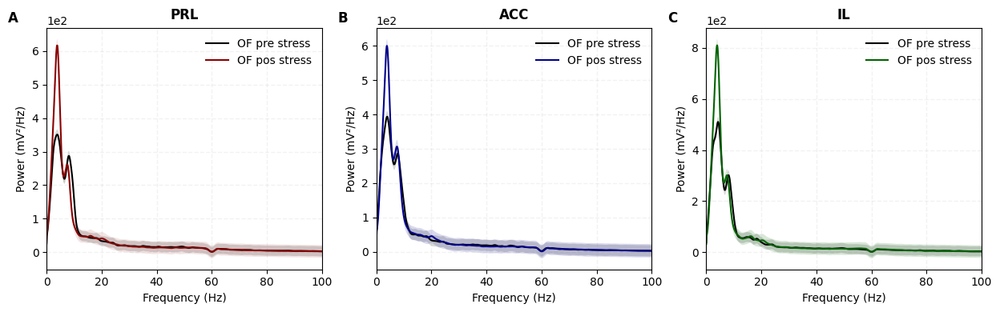

In [ ]:

figura = plt.figure(figsize=(12.5,4))

ax1 = figura.add_subplot(131)

ax1.text(-0.14, 1.07, "A", transform=ax1.transAxes, fontsize=12, fontweight="bold", va="top")

x = mean_psd[ (mean_psd['condicao'] == 'OF_pre') & (mean_psd['regiao'] == 'PRL')]['F']
y_prl =  (mean_psd[ (mean_psd['condicao'] == 'OF_pre') & (mean_psd['regiao'] == 'PRL')]['PSD'] + 1e-10) #aqui foi adicionado uma constante para eliminar valores negativos do calculo e conseguir calcular o std
std = np.std(y_prl)/np.sqrt(6)  # Cálculo do desvio padrão

x_pos = mean_psd[ (mean_psd['condicao'] == 'OF_pos')  & (mean_psd['regiao'] == 'PRL')]['F']
y_pos_prl =   ( mean_psd[ (mean_psd['condicao'] == 'OF_pos')  & (mean_psd['regiao'] == 'PRL')]['PSD'] + 1e-10)
std_pos = np.std(y_pos_prl)/np.sqrt(6)

plt.plot(x, y_prl, linewidth=1.5, color='black', label='OF pre stress')
plt.fill_between(x, y_prl - std, y_prl + std, color='gray', alpha=0.3,  edgecolor=None)

plt.plot(x_pos, y_pos_prl, linewidth=1.5, color='darkred', label='OF pos stress')
plt.fill_between(x_pos, y_pos_prl - std_pos, y_pos_prl + std_pos, color='darkred', alpha=0.1,  edgecolor=None)

plt.grid(color='grey', linestyle='--', linewidth=1, alpha=0.1, axis='both', which='both')
plt.legend(fontsize=10, loc='upper right', frameon=False)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power (mV²/Hz)')
plt.title('PRL', fontweight='bold',  pad = 8, fontsize = 12)
plt.xlim(0,100)
plt.xticks(np.arange(0, 101, 20))
plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0))

ax2 = figura.add_subplot(132)
ax2.text(-0.14, 1.07, "B", transform=ax2.transAxes, fontsize=12, fontweight="bold", va="top")

x = mean_psd[ (mean_psd['condicao'] == 'OF_pre')  & (mean_psd['regiao'] == 'ACC')]['F']
y_cg =( mean_psd[ (mean_psd['condicao'] == 'OF_pre')  & (mean_psd['regiao'] == 'ACC')]['PSD']   + 1e-10)
std_cg = np.std(y_cg)/np.sqrt(6)  # Cálculo do desvio padrão

x_pos = mean_psd[ (mean_psd['condicao'] == 'OF_pos') & (mean_psd['regiao'] == 'ACC') ]['F']
y_pos_cg = ( mean_psd[ (mean_psd['condicao'] == 'OF_pos') & (mean_psd['regiao'] == 'ACC')]['PSD']  + 1e-10)
std_pos_cg = np.std(y_pos_cg)/np.sqrt(6)

plt.plot(x, y_cg, linewidth=1.5, color='black', label='OF pre stress')
plt.fill_between(x, y_cg - std_cg, y_cg + std_cg, color='gray', alpha=0.3, edgecolor=None)

plt.plot(x_pos, y_pos_cg, linewidth=1.5, color='darkblue', label='OF pos stress')
plt.fill_between(x_pos, y_pos_cg - std_pos_cg, y_pos_cg + std_pos_cg, color='darkblue', alpha=0.15, edgecolor=None)

plt.grid(color='grey', linestyle='--', linewidth=1, alpha=0.1, axis='both', which='both')
plt.legend(fontsize=10, loc='upper right', frameon=False)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power (mV²/Hz)')
plt.title('ACC', fontweight='bold',  pad = 8, fontsize = 12)
plt.xlim(0,100)
plt.xticks(np.arange(0, 101, 20))
plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0))

ax3 = figura.add_subplot(133)
ax3.text(-0.14, 1.07, "C", transform=ax3.transAxes, fontsize=12, fontweight="bold", va="top")

x = mean_psd[ (mean_psd['condicao'] == 'OF_pre') & (mean_psd['regiao'] == 'IL')]['F']
y_il =(mean_psd[ (mean_psd['condicao'] == 'OF_pre') & (mean_psd['regiao'] == 'IL')]['PSD'] + 1e-10)
std_il = np.std(y_il)/np.sqrt(6)  # Cálculo do desvio padrão

x_pos = mean_psd[ (mean_psd['condicao'] == 'OF_pos') & (mean_psd['regiao'] == 'IL')]['F']
y_pos_il = (mean_psd[(mean_psd['condicao'] == 'OF_pos') & (mean_psd['regiao'] == 'IL')]['PSD'] + 1e-10)
std_pos_il = np.std(y_pos_il)/np.sqrt(6)

plt.plot(x, y_il, linewidth=1.5, color='k', label='OF pre stress')
plt.fill_between(x, y_il - std_il, y_il + std_il, color='gray', alpha=0.3, edgecolor=None)

plt.plot(x_pos, y_pos_il, linewidth=1.5, color='darkgreen', label='OF pos stress')
plt.fill_between(x_pos, y_pos_il - std_pos_il, y_pos_il + std_pos_il, color='darkgreen', alpha=0.15, edgecolor=None)

plt.grid(color='grey', linestyle='--', linewidth=1, alpha=0.1, axis='both', which='both')
plt.legend(fontsize=10, loc='upper right', frameon=False)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power (mV²/Hz)')
plt.title('IL', fontweight='bold',  pad = 8, fontsize = 12)
plt.xlim(0,100)
plt.xticks(np.arange(0, 101, 20))
plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0))


plt.tight_layout()
# plt.savefig('/content/drive/Shareddrives/Stress 1K/PROJETO LH PFC/FIGURES/psd_0_100Hz.jpeg')

plt.show()

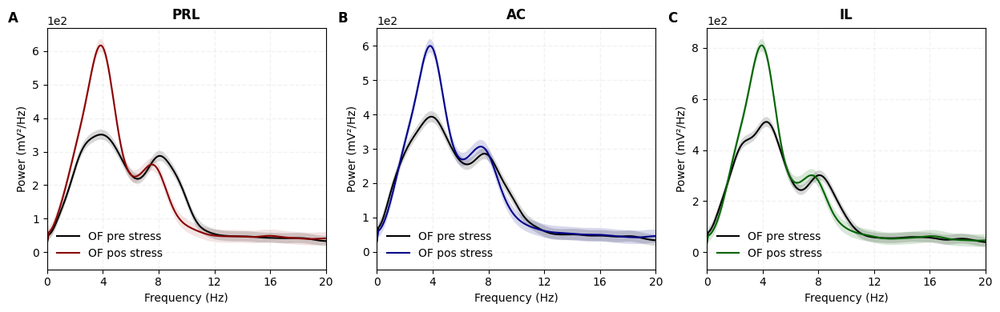

In [ ]:

figura = plt.figure(figsize=(12.5,4))
# figura.suptitle('PSD OF pre and pos stress session', fontweight ="bold", fontsize = 12)
# gs = gridspec.GridSpec(1, 2, width_ratios=[0.7, 1.5])
ax1 = figura.add_subplot(131)

ax1.text(-0.14, 1.07, "A", transform=ax1.transAxes, fontsize=12, fontweight="bold", va="top")

x = mean_psd[ (mean_psd['condicao'] == 'OF_pre') & (mean_psd['regiao'] == 'PRL')]['F']
y_prl =  (mean_psd[ (mean_psd['condicao'] == 'OF_pre') & (mean_psd['regiao'] == 'PRL')]['PSD'] + 1e-10) #aqui foi adicionado uma constante para eliminar valores negativos do calculo e conseguir calcular o std
std = np.std(y_prl)/np.sqrt(6)  # Cálculo do desvio padrão

x_pos = mean_psd[ (mean_psd['condicao'] == 'OF_pos')  & (mean_psd['regiao'] == 'PRL')]['F']
y_pos_prl =   ( mean_psd[ (mean_psd['condicao'] == 'OF_pos')  & (mean_psd['regiao'] == 'PRL')]['PSD'] + 1e-10)
std_pos = np.std(y_pos_prl)/np.sqrt(6)

plt.plot(x, y_prl, linewidth=1.5, color='black', label='OF pre stress')
plt.fill_between(x, y_prl - std, y_prl + std, color='gray', alpha=0.3,  edgecolor=None)

plt.plot(x_pos, y_pos_prl, linewidth=1.5, color='darkred', label='OF pos stress')
plt.fill_between(x_pos, y_pos_prl - std_pos, y_pos_prl + std_pos, color='darkred', alpha=0.1,  edgecolor=None)


plt.grid(color='grey', linestyle='--', linewidth=1, alpha=0.1, axis='both', which='both')
plt.legend(fontsize=10, loc='lower left', frameon=False)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power (mV²/Hz)')
plt.xlim(0,20)
plt.xticks(np.arange(0, 21, 4))
plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
plt.title('PRL', fontweight='bold',  pad = 8, fontsize = 12)

ax2 = figura.add_subplot(132)
ax2.text(-0.14, 1.07, "B", transform=ax2.transAxes, fontsize=12, fontweight="bold", va="top")

x = mean_psd[ (mean_psd['condicao'] == 'OF_pre')  & (mean_psd['regiao'] == 'ACC')]['F']
y_cg =( mean_psd[ (mean_psd['condicao'] == 'OF_pre')  & (mean_psd['regiao'] == 'ACC')]['PSD']   + 1e-10)
std_cg = np.std(y_cg)/np.sqrt(6)  # Cálculo do desvio padrão

x_pos = mean_psd[ (mean_psd['condicao'] == 'OF_pos') & (mean_psd['regiao'] == 'ACC') ]['F']
y_pos_cg = ( mean_psd[ (mean_psd['condicao'] == 'OF_pos') & (mean_psd['regiao'] == 'ACC')]['PSD']  + 1e-10)
std_pos_cg = np.std(y_pos_cg)/np.sqrt(6)


plt.plot(x, y_cg, linewidth=1.5, color='black', label='OF pre stress')
plt.fill_between(x, y_cg - std_cg, y_cg + std_cg, color='gray', alpha=0.3, edgecolor=None)

plt.plot(x_pos, y_pos_cg, linewidth=1.5, color='darkblue', label='OF pos stress')
plt.fill_between(x_pos, y_pos_cg - std_pos_cg, y_pos_cg + std_pos_cg, color='darkblue', alpha=0.15, edgecolor=None)


plt.grid(color='grey', linestyle='--', linewidth=1, alpha=0.1, axis='both', which='both')
plt.legend(fontsize=10, loc='lower left', frameon=False)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power (mV²/Hz)')
plt.title('AC', fontweight='bold',  pad = 8, fontsize = 12)
plt.xlim(0,20)
plt.xticks(np.arange(0, 21, 4))
plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0))

ax3 = figura.add_subplot(133)
ax3.text(-0.14, 1.07, "C", transform=ax3.transAxes, fontsize=12, fontweight="bold", va="top")


x = mean_psd[ (mean_psd['condicao'] == 'OF_pre') & (mean_psd['regiao'] == 'IL')]['F']
y_il =(mean_psd[ (mean_psd['condicao'] == 'OF_pre') & (mean_psd['regiao'] == 'IL')]['PSD'] + 1e-10)
std_il = np.std(y_il)/np.sqrt(6)  # Cálculo do desvio padrão

x_pos = mean_psd[ (mean_psd['condicao'] == 'OF_pos') & (mean_psd['regiao'] == 'IL')]['F']
y_pos_il = (mean_psd[(mean_psd['condicao'] == 'OF_pos') & (mean_psd['regiao'] == 'IL')]['PSD'] + 1e-10)
std_pos_il = np.std(y_pos_il)/np.sqrt(6)


plt.plot(x, y_il, linewidth=1.5, color='k', label='OF pre stress')
plt.fill_between(x, y_il - std_il, y_il + std_il, color='gray', alpha=0.3, edgecolor=None)

plt.plot(x_pos, y_pos_il, linewidth=1.5, color='darkgreen', label='OF pos stress')
plt.fill_between(x_pos, y_pos_il - std_pos_il, y_pos_il + std_pos_il, color='darkgreen', alpha=0.15, edgecolor=None)


plt.grid(color='grey', linestyle='--', linewidth=1, alpha=0.1, axis='both', which='both')
plt.legend(fontsize=10, loc='lower left', frameon=False)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power (mV²/Hz)')
plt.title('IL', fontweight='bold',  pad = 8, fontsize = 12)
plt.xlim(0,20)
plt.xticks(np.arange(0, 21, 4))
plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0))

plt.tight_layout()
# plt.savefig('/content/drive/Shareddrives/Stress 1K/PROJETO LH PFC/FIGURES/psd_theta.jpeg')

plt.show()

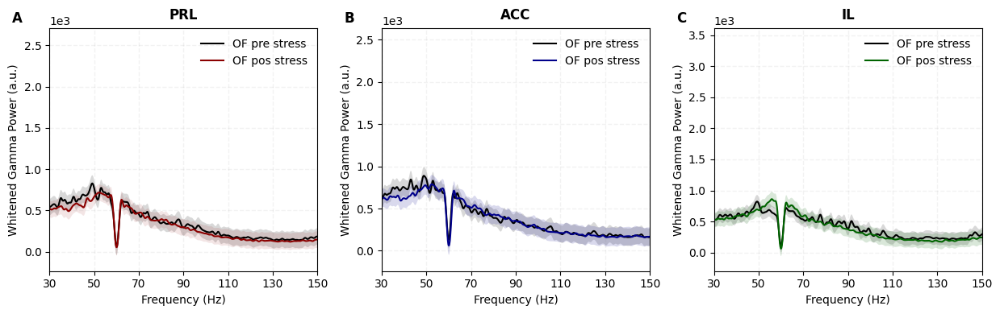

In [ ]:

figura = plt.figure(figsize=(12.5,4))

ax1 = figura.add_subplot(131)

ax1.text(-0.14, 1.07, "A", transform=ax1.transAxes, fontsize=12, fontweight="bold", va="top")

x = mean_psd[ (mean_psd['condicao'] == 'OF_pre') & (mean_psd['regiao'] == 'PRL')]['F']
y_prl =  (mean_psd[ (mean_psd['condicao'] == 'OF_pre') & (mean_psd['regiao'] == 'PRL')]['PSD'] + 1e-10)*x #aqui foi adicionado uma constante para eliminar valores negativos do calculo e conseguir calcular o std
std = np.std(y_prl)/np.sqrt(6)  # Cálculo do desvio padrão

x_pos = mean_psd[ (mean_psd['condicao'] == 'OF_pos')  & (mean_psd['regiao'] == 'PRL')]['F']
y_pos_prl =   ( mean_psd[ (mean_psd['condicao'] == 'OF_pos')  & (mean_psd['regiao'] == 'PRL')]['PSD'] + 1e-10)*x_pos
std_pos = np.std(y_pos_prl)/np.sqrt(6)

plt.plot(x, y_prl, linewidth=1.5, color='black', label='OF pre stress')
plt.fill_between(x, y_prl - std, y_prl + std, color='gray', alpha=0.3,  edgecolor=None)

plt.plot(x_pos, y_pos_prl, linewidth=1.5, color='darkred', label='OF pos stress')
plt.fill_between(x_pos, y_pos_prl - std_pos, y_pos_prl + std_pos, color='darkred', alpha=0.1,  edgecolor=None)

plt.grid(color='grey', linestyle='--', linewidth=1, alpha=0.1, axis='both', which='both')
plt.legend(fontsize=10, loc='upper right', frameon=False)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Whitened Gamma Power (a.u.)')
plt.title('PRL', fontweight='bold',  pad = 8, fontsize = 12)
plt.xlim(30,150)
plt.xticks(np.arange(30, 151, 20))
plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0))

ax2 = figura.add_subplot(132)
ax2.text(-0.14, 1.07, "B", transform=ax2.transAxes, fontsize=12, fontweight="bold", va="top")

x = mean_psd[ (mean_psd['condicao'] == 'OF_pre')  & (mean_psd['regiao'] == 'ACC')]['F']
y_cg =( mean_psd[ (mean_psd['condicao'] == 'OF_pre')  & (mean_psd['regiao'] == 'ACC')]['PSD']   + 1e-10)*x
std_cg = np.std(y_cg)/np.sqrt(6)  # Cálculo do desvio padrão

x_pos = mean_psd[ (mean_psd['condicao'] == 'OF_pos') & (mean_psd['regiao'] == 'ACC') ]['F']
y_pos_cg = ( mean_psd[ (mean_psd['condicao'] == 'OF_pos') & (mean_psd['regiao'] == 'ACC')]['PSD']  + 1e-10)*x_pos
std_pos_cg = np.std(y_pos_cg)/np.sqrt(6)

plt.plot(x, y_cg, linewidth=1.5, color='black', label='OF pre stress')
plt.fill_between(x, y_cg - std_cg, y_cg + std_cg, color='gray', alpha=0.3, edgecolor=None)

plt.plot(x_pos, y_pos_cg, linewidth=1.5, color='darkblue', label='OF pos stress')
plt.fill_between(x_pos, y_pos_cg - std_pos_cg, y_pos_cg + std_pos_cg, color='darkblue', alpha=0.15, edgecolor=None)

plt.grid(color='grey', linestyle='--', linewidth=1, alpha=0.1, axis='both', which='both')
plt.legend(fontsize=10, loc='upper right', frameon=False)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Whitened Gamma Power (a.u.)')
plt.title('ACC', fontweight='bold',  pad = 8, fontsize = 12)
plt.xlim(30,150)
plt.xticks(np.arange(30, 151, 20))
plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0))

ax3 = figura.add_subplot(133)
ax3.text(-0.14, 1.07, "C", transform=ax3.transAxes, fontsize=12, fontweight="bold", va="top")

x = mean_psd[ (mean_psd['condicao'] == 'OF_pre') & (mean_psd['regiao'] == 'IL')]['F']
y_il =(mean_psd[ (mean_psd['condicao'] == 'OF_pre') & (mean_psd['regiao'] == 'IL')]['PSD'] + 1e-10)*x
std_il = np.std(y_il)/np.sqrt(6)  # Cálculo do desvio padrão

x_pos = mean_psd[ (mean_psd['condicao'] == 'OF_pos') & (mean_psd['regiao'] == 'IL')]['F']
y_pos_il = (mean_psd[(mean_psd['condicao'] == 'OF_pos') & (mean_psd['regiao'] == 'IL')]['PSD'] + 1e-10)*x_pos
std_pos_il = np.std(y_pos_il)/np.sqrt(6)

plt.plot(x, y_il, linewidth=1.5, color='k', label='OF pre stress')
plt.fill_between(x, y_il - std_il, y_il + std_il, color='gray', alpha=0.3, edgecolor=None)

plt.plot(x_pos, y_pos_il, linewidth=1.5, color='darkgreen', label='OF pos stress')
plt.fill_between(x_pos, y_pos_il - std_pos_il, y_pos_il + std_pos_il, color='darkgreen', alpha=0.15, edgecolor=None)

plt.grid(color='grey', linestyle='--', linewidth=1, alpha=0.1, axis='both', which='both')
plt.legend(fontsize=10, loc='upper right', frameon=False)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Whitened Gamma Power (a.u.)')
plt.title('IL', fontweight='bold',  pad = 8, fontsize = 12)
plt.xlim(30,150)
plt.xticks(np.arange(30, 151, 20))
plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0))


plt.tight_layout()
# plt.savefig('/content/drive/MyDrive/figures/psd_depois_de_corrigir.jpeg')

plt.show()

In [ ]:
# FAZENDO O DF COM A MEDIA DO PSD DE CADA ANIMAL

agrupar = df_psd.groupby(['animal', 'condicao', 'regiao', 'banda'])

#  média para cada grupo
mean_psd_animal = agrupar['PSD'].mean().reset_index()

psd_theta_por_animal = pd.DataFrame(mean_psd_animal[(mean_psd_animal['banda'] == 'Theta') ])



In [ ]:
mean_psd_animal

<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen impo

,animal,condicao,regiao,banda,PSD
0,CCM04,OF_pos,ACC,Alpha/beta,41.970105
1,CCM04,OF_pos,ACC,Delta,260.994622
2,CCM04,OF_pos,ACC,High gamma,1.718546
3,CCM04,OF_pos,ACC,Low gamma,16.815480
4,CCM04,OF_pos,ACC,Mid gamma,8.862591
...,...,...,...,...,...
211,CCM559,OF_pre,PRL,Delta,182.639159
212,CCM559,OF_pre,PRL,High gamma,1.409438
213,CCM559,OF_pre,PRL,Low gamma,17.818325
214,CCM559,OF_pre,PRL,Mid gamma,7.017564


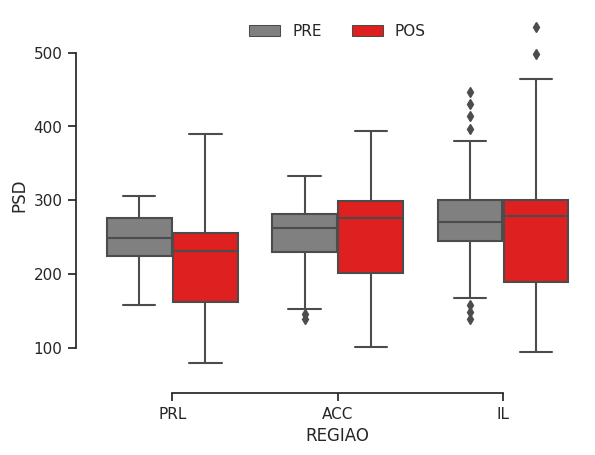

In [ ]:
sns.set_theme(style="ticks", palette="pastel")

# Load the example tips dataset


# Draw a nested boxplot to show bills by day and time
ax = sns.boxplot(x="REGIAO", y="PSD",
            hue="condicao", palette=["grey", "red"],
            data=df_barplot_theta)

# plt.legend()
ax.legend(title='', loc='upper center', frameon=False,ncol=2)
# plt.legend(ncol=2)
sns.despine(offset=10, trim=True)

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:k'` for same effect.
  warnings.warn(msg, FutureWarning)


([<matplotlib.axis.YTick at 0x7fd6119050f0>,
 [Text(0, 0, '0'),
  Text(0, 100, '100'),
  Text(0, 200, '200'),
  Text(0, 300, '300'),
  Text(0, 400, '400'),
  Text(0, 500, '500'),
  Text(0, 600, '600')])

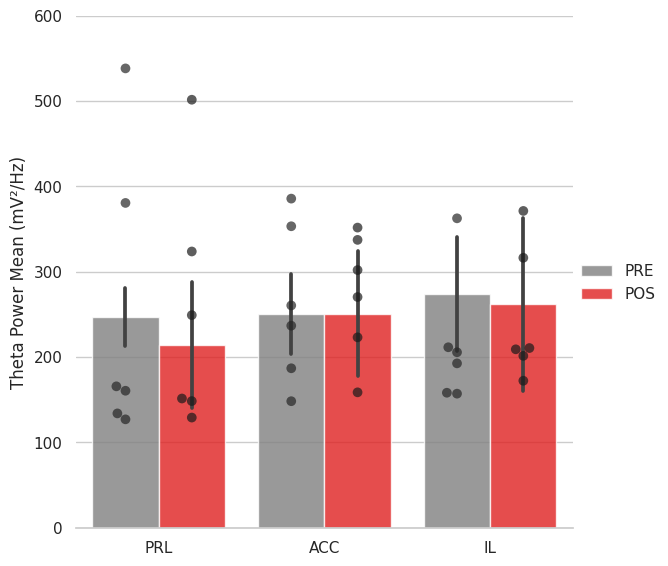

In [ ]:
import seaborn as sns
sns.set_theme(style="whitegrid")


g = sns.catplot(
    data=df_barplot_theta, kind="bar",
    x="REGIAO", y="PSD", hue="condicao",
    errorbar='sd', palette=['grey', 'red'], alpha=0.8, height=6,
)

sns.swarmplot(
    data=psd_theta_por_animal, x="regiao", y="PSD", hue="condicao",
    color="k", size=7, dodge=True, alpha=0.7 , legend=False   #, ax=g.ax
)



# g.ax.axhline(y=690, color='black', linestyle='-', linewidth=1.5, xmin=0.05, xmax=0.25)
# g.ax.text(0,690, '***', color='black', fontsize=12, ha='center')

# g.ax.axhline(y=530, color='black', linestyle='-', linewidth=1.5, xmin=0.4, xmax=0.6)
# g.ax.text(1,530, '***', color='black', fontsize=12, ha='center')

# g.ax.axhline(y=530, color='black', linestyle='-', linewidth=1.5, xmin=0.75, xmax=0.95)
# g.ax.text(2,530, '***', color='black', fontsize=12, ha='center')

g.despine(left=True)
g.set_axis_labels("", 'Theta Power Mean (mV²/Hz)')
g.legend.set_title("")
# plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
plt.yticks(np.arange(0, 601, 100))

# plt.savefig('/content/drive/Shareddrives/Stress 1K/PROJETO LH PFC/FIGURES/psd_barplot_theta_mean_segunda_opção.jpeg')

# > PSD statistics

In [ ]:
from scipy.stats import mannwhitneyu
regions = df_barplot_theta['REGIAO'].unique()

condition_1 = df_barplot_theta[(df_barplot_theta['REGIAO'] == 'PRL') & (df_barplot_theta['condicao'] == 'PRE')]['PSD']
condition_2 = df_barplot_theta[(df_barplot_theta['REGIAO'] == 'PRL') & (df_barplot_theta['condicao'] == 'POS')]['PSD']

statistic, p_value = mannwhitneyu(condition_1, condition_2)

print(f" U-statistic = {statistic}, p-value = {p_value}")

 U-statistic = 1162.0, p-value = 0.3556979404356435


In [ ]:


condition_1 = df_barplot_theta[(df_barplot_theta['REGIAO'] == 'ACC') & (df_barplot_theta['condicao'] == 'PRE')]['PSD']
condition_2 = df_barplot_theta[(df_barplot_theta['REGIAO'] == 'ACC') & (df_barplot_theta['condicao'] == 'POS')]['PSD']

statistic, p_value = mannwhitneyu(condition_1, condition_2)

print(f" U-statistic = {statistic}, p-value = {p_value}")

 U-statistic = 805.0, p-value = 0.0009233724440707991


In [ ]:
condition_1 = df_barplot_theta[(df_barplot_theta['REGIAO'] == 'IL') & (df_barplot_theta['condicao'] == 'PRE')]['PSD']
condition_2 = df_barplot_theta[(df_barplot_theta['REGIAO'] == 'IL') & (df_barplot_theta['condicao'] == 'POS')]['PSD']

statistic, p_value = mannwhitneyu(condition_1, condition_2)

print(f" U-statistic = {statistic}, p-value = {p_value}")

 U-statistic = 968.0, p-value = 0.026284735828375944


> # ESPECTROGRAMAS

In [ ]:
spectrogram_prl_pre = []
srate = 1000
w = 12.
freq = np.linspace(1, int(srate/2), int(srate/2))
widths = w*srate / (2*freq*np.pi)

for i in range(len(data_prl_pre)):
  spec = np.abs(signal.cwt(data_prl_pre[i], signal.morlet2, widths, w=w))
  spectrogram_prl_pre.append(spec)

spec_prl_pre = np.mean(spectrogram_prl_pre, axis = 0)

spectrogram_prl_pos = []
srate = 1000
w = 12.
freq = np.linspace(1, int(srate/2), int(srate/2))
widths = w*srate / (2*freq*np.pi)

for i in range(len(data_prl_pos)):
  spec_pos = np.abs(signal.cwt(data_prl_pos[i], signal.morlet2, widths, w=w))
  spectrogram_prl_pos.append(spec_pos)

spec_prl_pos = np.mean(spectrogram_prl_pos, axis = 0)

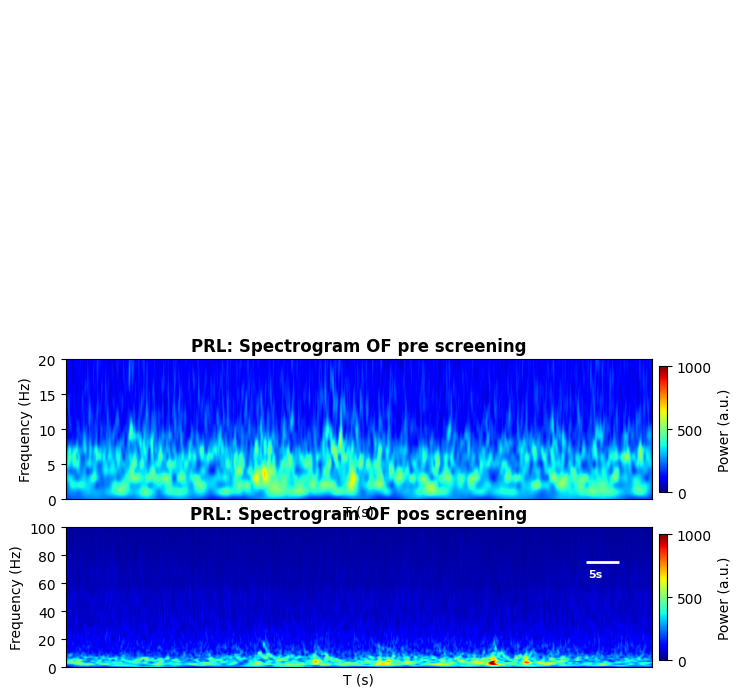

In [ ]:
fig, axs = plt.subplots(2, 1, figsize=(9, 4))
im = axs[0].imshow(spec_prl_pre, interpolation='gaussian', cmap='jet', vmin=0, vmax=1000, aspect='auto', alpha=1, label='Spectrogram')
axs[0].set_ylim([0, 20])
axs[0].set_ylabel('Frequency (Hz)')
axs[0].set_xlabel('T (s)')
axs[0].set_xticks([])
axs[0].set_title('PRL: Spectrogram OF pre screening', fontweight='bold')


cbar = fig.colorbar(im, ax=axs[0], aspect=15, pad=0.01, shrink=0.9, location='right')
cbar.set_label('Power (a.u.)')
cbar.set_ticks([0,500, 1000])

axs[0].hlines(y=75, xmin=80000, xmax=85000, color='white', linewidth = 2)
axs[0].text(82500, 70, '5s', ha='right', va='top', color='white', fontweight = 'bold', fontsize = 8)

# subplot 2

im = axs[1].imshow(spec_prl_pos, interpolation='gaussian', cmap='jet', vmin=0, vmax=1000, aspect='auto', alpha=1, label='Spectrogram')
axs[1].set_ylim([0, 100])
axs[1].set_ylabel('Frequency (Hz)')
axs[1].set_xlabel('T (s)')
axs[1].set_xticks([])
axs[1].set_title('PRL: Spectrogram OF pos screening', fontweight='bold')


cbar = fig.colorbar(im, ax=axs[1], aspect=15, pad=0.01, shrink=0.9, location='right')
cbar.set_label('Power (a.u.)')
cbar.set_ticks([0,500, 1000])


axs[1].hlines(y=75, xmin=80000, xmax=85000, color='white', linewidth = 2)
axs[1].text(82500, 70, '5s', ha='right', va='top', color='white', fontweight = 'bold', fontsize = 8)

plt.subplots_adjust(wspace=0.20)
# plt.tight_layout()
plt.show()

In [ ]:

vmin = 0.0002
vmax = np.percentile(data_pac_pre, 97.5)



figura = plt.figure(figsize=(8,4.5))
figura.suptitle('PAC IL ', fontweight ="bold", fontsize = 16)
# gs = gridspec.GridSpec(1, 2, width_ratios=[0.7, 1.5])
figura.add_subplot(121)

plt.title('OF pre stress', fontweight ="bold")
extent = [lentaVector[0]+lenta_BandWidth/2,lentaVector[-1]+lenta_BandWidth/2,(altaVector[-1]+alta_BandWidth/2)+5,altaVector[0]+alta_BandWidth/2]
im1 = plt.imshow(data_pac_pre,extent = extent,interpolation = 'gaussian',cmap = 'jet',vmin = vmin, vmax = vmax,aspect = 'auto', label = 'PRL OF pre secreening')

plt.yticks(ticks = ((altaVector+alta_BandWidth/2)+5).astype(int))
plt.gca().invert_yaxis()
plt.xticks(ticks = np.round((lentaVector+lenta_BandWidth/2)-0.2).astype(int))

plt.xlabel('Phase Frequency (Hz)')
plt.ylabel('Amp Frequency (Hz)')

figura.add_subplot(122)

vmin =  0.0002
vmax = np.percentile(data_pac_pos, 97.5)

plt.title('OF pos stress', fontweight ="bold")

extent = [lentaVector[0]+lenta_BandWidth/2,lentaVector[-1]+lenta_BandWidth/2,(altaVector[-1]+alta_BandWidth/2)+5,altaVector[0]+alta_BandWidth/2]
im2 = plt.imshow(data_pac_pos,extent = extent,interpolation = 'gaussian',cmap = 'jet',vmin = vmin, vmax = vmax,aspect = 'auto', label = 'PRL OF pre secreening')

plt.yticks(ticks = ((altaVector+alta_BandWidth/2)+5).astype(int))
plt.gca().invert_yaxis()
plt.xticks(ticks = np.round((lentaVector+lenta_BandWidth/2)-0.2).astype(int))

plt.xlabel('Phase Frequency (Hz)')
plt.ylabel('Amp Frequency (Hz)')

cax = figura.add_axes([0.9, 0.85, 0.07, 0.02])
cbar = figura.colorbar(im1, cax=cax, orientation='horizontal')
cbar.set_label('MI')
cbar.ax.xaxis.set_label_coords(0.5, 2.2)
cbar.set_ticks([])
cbar.set_ticklabels([])
cbar.ax.xaxis.label.set_fontsize(9)
cax.text(-12.5, 4, "A", transform=cax.transAxes, fontsize=12, fontweight="bold", va="top")


cax = figura.add_axes([0.41, 0.85, 0.07, 0.02])
cbar = figura.colorbar(im2, cax=cax, orientation='horizontal')
cbar.set_label('MI')
cbar.ax.xaxis.set_label_coords(0.5, 2.2)
cbar.set_ticks([])
cbar.set_ticklabels([])
cbar.ax.xaxis.label.set_fontsize(9)
# cax.text(0.5, 1.15, "B", transform=ax1.transAxes, fontsize=12, fontweight="bold", va="top")

plt.subplots_adjust(wspace=0.20)
# plt.grid(False)
plt.tight_layout()
# plt.savefig('/content/drive/MyDrive/figures/PAC_PRL_AC_4animais.jpeg')

> # Phase Analysis

In [ ]:
data_prl_pre = []
data_prl_pos = []
data_cg_pre = []
data_cg_pos = []
data_il_pre = []
data_il_pos = []

for rato in ratos.keys():
  prl_pre = df[(df['animal'] == str(rato)) & (df['condicao'] == 'OF_pre')]['data_PRL']
  data_prl_pre.append(prl_pre)

  prl_pos = df[(df['animal'] == str(rato)) & (df['condicao'] == 'OF_pos')]['data_PRL']
  data_prl_pos.append(prl_pos)

  cg_pre = df[(df['animal'] == str(rato)) & (df['condicao'] == 'OF_pre')]['data_CG']
  data_cg_pre.append(cg_pre)

  cg_pos = df[(df['animal'] == str(rato)) & (df['condicao'] == 'OF_pos')]['data_CG']
  data_cg_pos.append(cg_pos)

  il_pre = df[(df['animal'] == str(rato)) & (df['condicao'] == 'OF_pre')]['data_IL']
  data_il_pre.append(il_pre)

  il_pos = df[(df['animal'] == str(rato)) & (df['condicao'] == 'OF_pos')]['data_IL']
  data_il_pos.append(il_pos)

In [ ]:
mean = np.mean(data_prl_pre,axis = 0)

In [ ]:
phases = []
amps = []

for i in range(6):
  amp = data_prl_pre[i]
  phase = eegfilt( data_prl_pre[i] ,1000,5,10  )
  phases.append(phase)
  amps.append(amp)

In [ ]:
len(phase)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


90000

In [ ]:
x = data_prl_pre

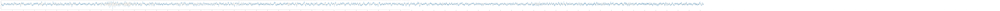

In [ ]:
plt.figure(figsize=(600,6))
plt.plot(np.arange(0, len(amp[:]), step=1), amp[:], linewidth=1.5);
plt.plot(np.arange(0, len(phase[:]), step=1), phase[:], linewidth=1.5);
# plt.gca().get_xaxis().get_major_formatter().set_scientific(False)
plt.xlim((0, len(phase[:])))
plt.xticks( np.arange(0, len(phase[:]), step=1000), rotation='vertical' );
plt.show()

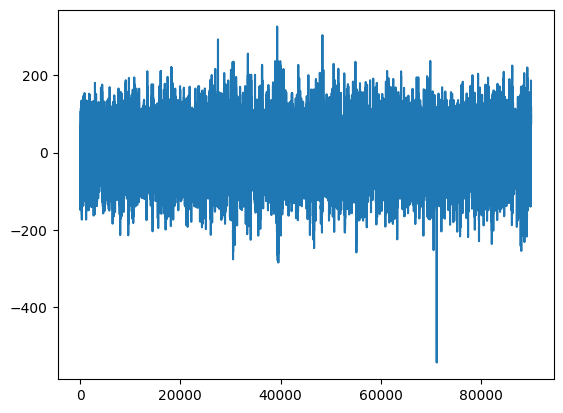

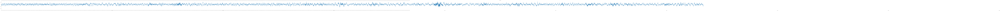

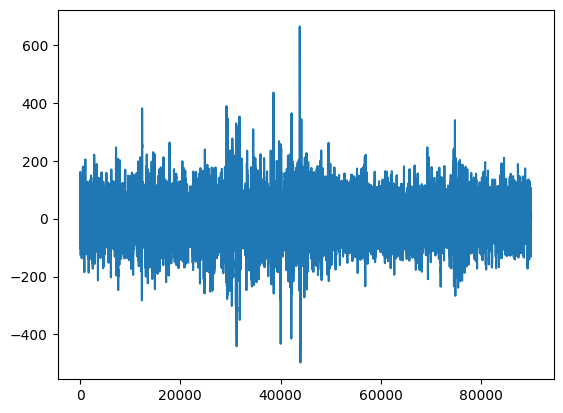

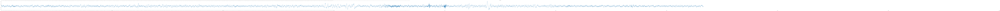

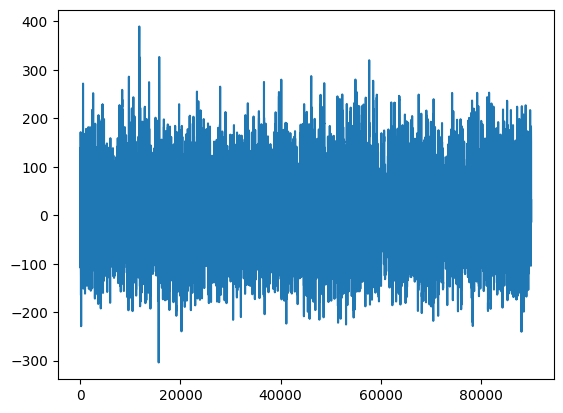

...

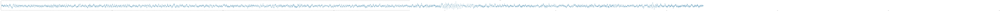

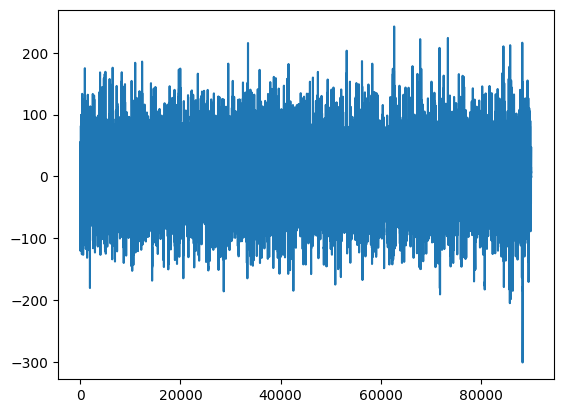

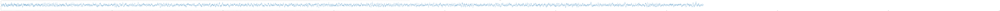

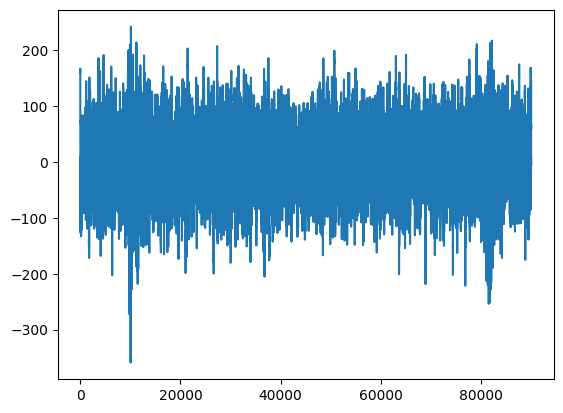

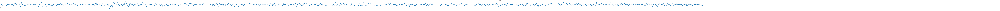

In [ ]:
for i in range(6):
  plt.figure()
  plt.plot(data_prl_pre[i])
  plt.figure(figsize=(600,6))
  plt.plot(np.arange(0, len(data_prl_pre[i]), step=1), data_prl_pre[i], linewidth=1.5);
  # plt.plot(np.arange(0, len(phase[:]), step=1), phase[:], linewidth=1.5);
  # plt.gca().get_xaxis().get_major_formatter().set_scientific(False)
  plt.xlim((0, len(data_prl_pre[i])))
  # plt.xticks( np.arange(0, len(sinal[:,0]), step=1000), rotation='vertical' );



  plt.title('Animal '+ str(i+1))

<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()


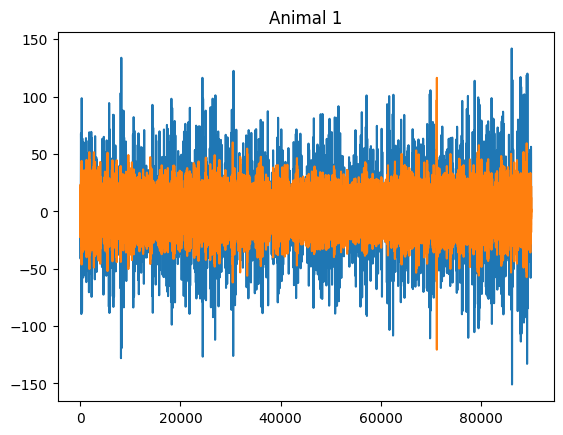

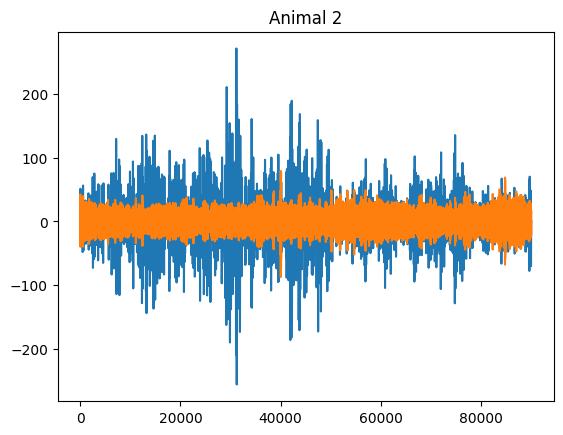

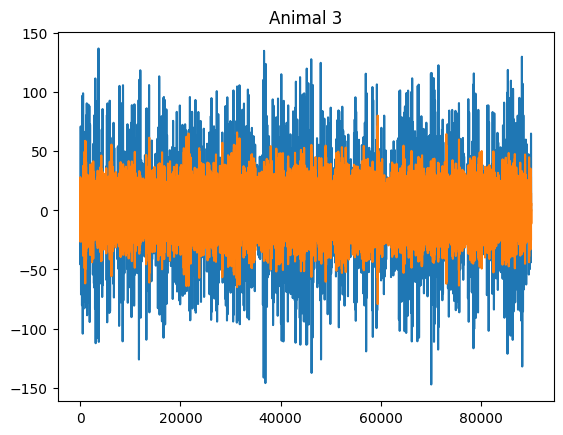

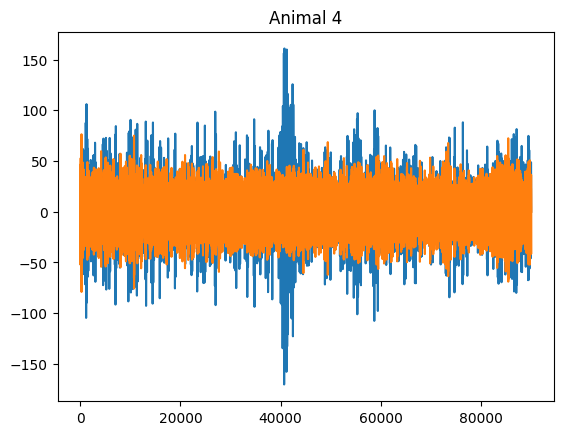

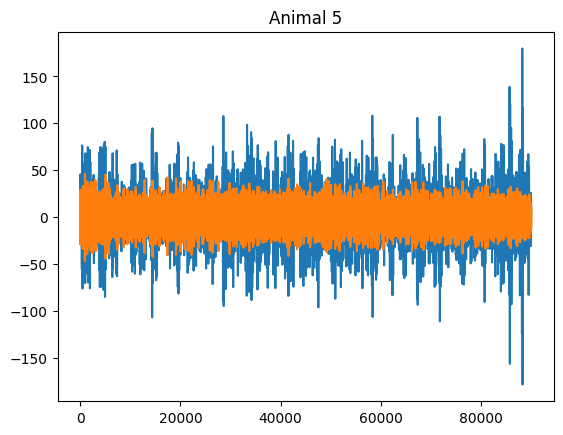

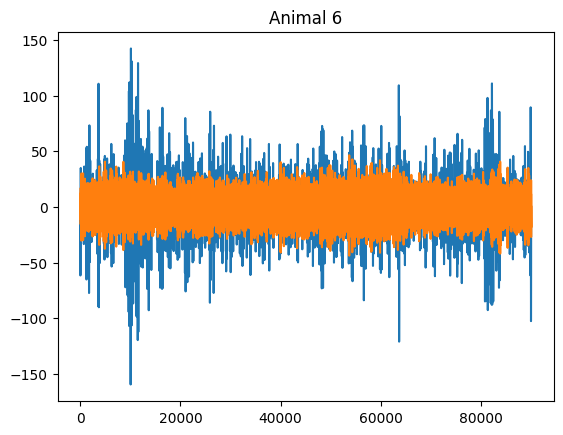

In [ ]:
for i in range(6):
  plt.figure()
  plt.plot(phases[i])
  plt.plot(amps[i])
  plt.title('Animal '+ str(i+1))

# plt.savefig('/content/drive/MyDrive/figures/PAC_PRL_AC_4animais.jpeg')

In [ ]:
amp=eegfilt(mean,1000,30,150) # just filtering

# analytic_signal1 = signal.hilbert(Amp)
# amplitude = (np.abs(analytic_signal1))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
phase = eegfilt(mean,1000,4,10)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


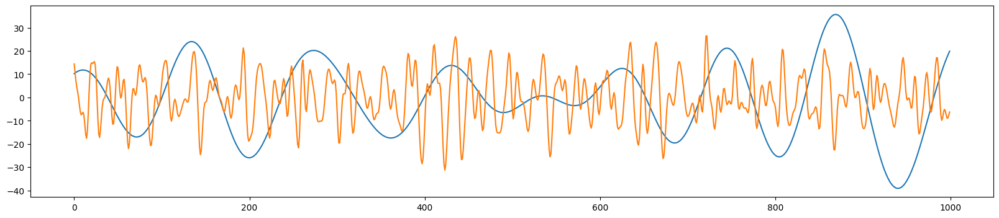

In [ ]:
  plt.figure(figsize=(20, 4))
  plt.plot(phase[5000:6000])
  plt.plot(amp[5000:6000])

In [ ]:
len(amplitude)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


90000

(0.0, 1000.0)

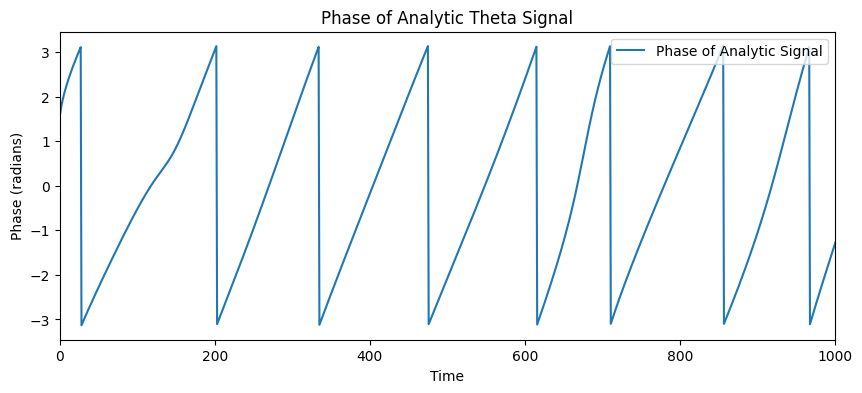

In [ ]:
import numpy as np
from scipy.signal import butter, filtfilt, hilbert
import matplotlib.pyplot as plt



# Hilbert transform
theta_analytic = hilbert(theta_filtered)

# Extract phase
theta_phase = np.angle(theta_analytic)


# Plot the phase of the analytic signal
plt.figure(figsize=(10, 4))
plt.plot(theta_phase, label='Phase of Analytic Signal')
plt.title('Phase of Analytic Theta Signal')
plt.xlabel('Time')
plt.ylabel('Phase (radians)')
plt.legend()

plt.xlim(0,1000)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<Axes: ylabel='Count'>

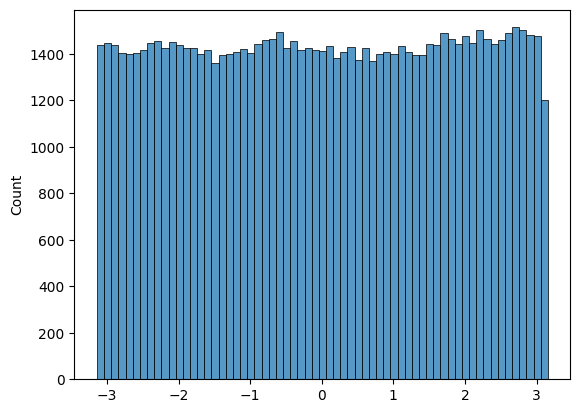

In [ ]:
# sns.displot(x=theta_phase, y=amplitude)
sns.histplot(data=amplitude, x=theta_phase, binwidth=0.1 )

<Figure size 1000x600 with 0 Axes>

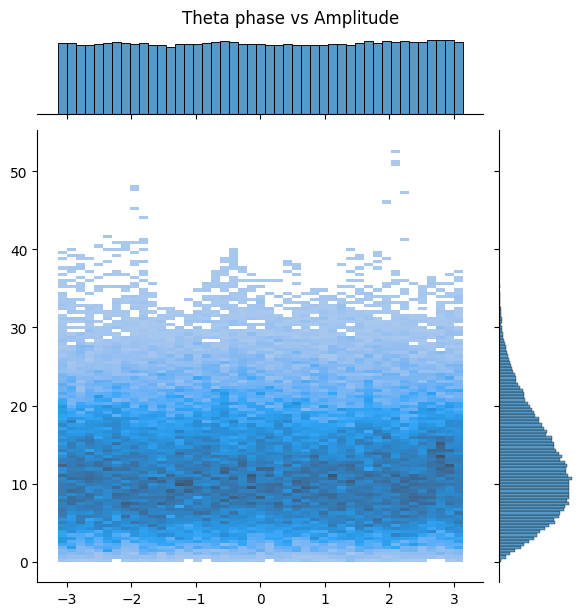

In [ ]:

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.jointplot(x=theta_phase, y=amplitude, kind='hist')
plt.suptitle('Theta phase vs Amplitude', y=1.02)
plt.show()




> # Phase amplitude histogram

In [ ]:
data_prl_pre = []
data_prl_pos = []
data_cg_pre = []
data_cg_pos = []
data_il_pre = []
data_il_pos = []

for rato in ratos.keys():
  prl_pre = df[(df['animal'] == str(rato)) & (df['condicao'] == 'OF_pre')]['data_PRL']
  data_prl_pre.append(prl_pre)

  prl_pos = df[(df['animal'] == str(rato)) & (df['condicao'] == 'OF_pos')]['data_PRL']
  data_prl_pos.append(prl_pos)

  cg_pre = df[(df['animal'] == str(rato)) & (df['condicao'] == 'OF_pre')]['data_CG']
  data_cg_pre.append(cg_pre)

  cg_pos = df[(df['animal'] == str(rato)) & (df['condicao'] == 'OF_pos')]['data_CG']
  data_cg_pos.append(cg_pos)

  il_pre = df[(df['animal'] == str(rato)) & (df['condicao'] == 'OF_pre')]['data_IL']
  data_il_pre.append(il_pre)

  il_pos = df[(df['animal'] == str(rato)) & (df['condicao'] == 'OF_pos')]['data_IL']
  data_il_pos.append(il_pos)

In [ ]:
# pac parameters PRL

lentaVector = np.arange(1,12,1)
altaVector = np.arange(30,150,10)
lenta_BandWidth = 2
alta_BandWidth = 10
numbin = 18




phase_amp_hist_pre_prl_cg = []

for i in range(6):
  phase_amp_hist_pre = pac_histogram(data_prl_pre[i],data_cg_pre[i],altaVector,lenta_BandWidth,alta_BandWidth,1000,numbin)
  phase_amp_hist_pre_prl_cg.append(phase_amp_hist_pre)

data_pac_hist_pre = np.mean(phase_amp_hist_pre_prl_cg,axis = 0)

phase_amp_hist_pos_prl_cg = []

for i in range(6):
  phase_amp_hist_pos = pac_histogram(data_prl_pos[i],data_cg_pos[i],altaVector,lenta_BandWidth,alta_BandWidth,1000,numbin)
  phase_amp_hist_pos_prl_cg.append(phase_amp_hist_pos)

data_pac_hist_pos = np.mean(phase_amp_hist_pre_prl_cg,axis = 0)




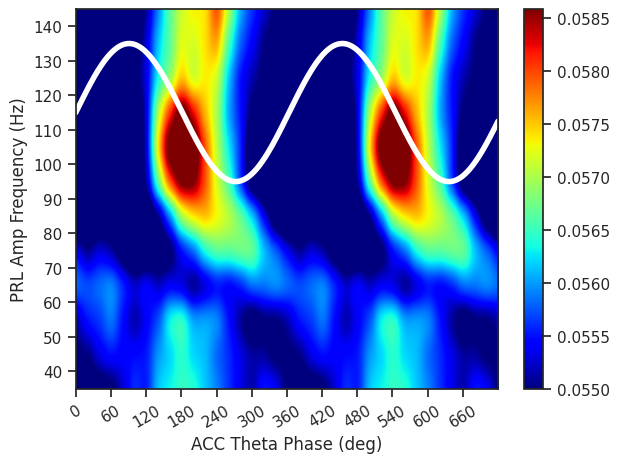

In [ ]:
t = np.linspace(0,36,1000)
sine_wave = 2*np.sin(2*np.pi*t*0.055)+8

# extent = [0,720,altaVector[-1]+alta_BandWidth/2,altaVector[0]+alta_BandWidth/2]
extent = [0,720,30,150]

vmin = 0.055
vmax = np.percentile(data_pac_hist_pre, 97.5)
pac_plot = np.mean(phase_amp_hist_pre_prl_cg, axis = 0)
plt.imshow(np.hstack([pac_plot,pac_plot,pac_plot]),interpolation = 'gaussian',cmap = 'jet',vmin = vmin, vmax = vmax,aspect = 'auto')

plt.yticks(ticks = np.arange(0.5,12.5),labels = ((altaVector+alta_BandWidth/2)+5).astype(int))
plt.xticks(ticks = np.arange(16,52,3),labels = np.round(np.arange(0,720,60)).astype(int),rotation = 30)
plt.plot(np.linspace(16,52,1000),sine_wave,color = 'white',linewidth = 4)
plt.ylim([0,11])
plt.xlim([16,52])

plt.ylabel('PRL Amp Frequency (Hz)')
plt.xlabel('ACC Theta Phase (deg)')

plt.colorbar()


plt.tight_layout()

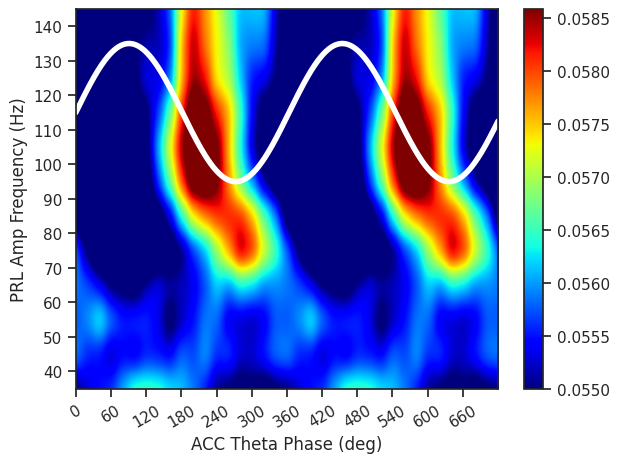

In [ ]:
t = np.linspace(0,36,1000)
sine_wave = 2*np.sin(2*np.pi*t*0.055)+8

# extent = [0,720,altaVector[-1]+alta_BandWidth/2,altaVector[0]+alta_BandWidth/2]
extent = [0,720,30,150]

vmin = 0.055
vmax = np.percentile(data_pac_hist_pre, 97.5)
pac_plot = np.mean(phase_amp_hist_pos_prl_cg, axis = 0)
plt.imshow(np.hstack([pac_plot,pac_plot,pac_plot]),interpolation = 'gaussian',cmap = 'jet',vmin = vmin, vmax = vmax,aspect = 'auto')

plt.yticks(ticks = np.arange(0.5,12.5),labels = ((altaVector+alta_BandWidth/2)+5).astype(int))
plt.xticks(ticks = np.arange(16,52,3),labels = np.round(np.arange(0,720,60)).astype(int),rotation = 30)
plt.plot(np.linspace(16,52,1000),sine_wave,color = 'white',linewidth = 4)
plt.ylim([0,11])
plt.xlim([16,52])

plt.ylabel('PRL Amp Frequency (Hz)')
plt.xlabel('ACC Theta Phase (deg)')

plt.colorbar()


plt.tight_layout()

In [ ]:

vmin =  0.0004
vmax = np.percentile(data_pac_pre, 97.5)  # Define vmax como o 95º percentil


figura = plt.figure(figsize=(8,4.5))
figura.suptitle('PAC PRL ', fontweight ="bold", fontsize = 16)
# gs = gridspec.GridSpec(1, 2, width_ratios=[0.7, 1.5])
figura.add_subplot(121)

plt.title('OF pre stress', fontweight ="bold")
extent = [lentaVector[0]+lenta_BandWidth/2,lentaVector[-1]+lenta_BandWidth/2,(altaVector[-1]+alta_BandWidth/2)+5,altaVector[0]+alta_BandWidth/2]
im1 = plt.imshow(data_pac_pre,extent = extent,interpolation = 'gaussian',cmap = 'jet',vmin = vmin, vmax = vmax,aspect = 'auto', label = 'PRL OF pre secreening')

plt.yticks(ticks = ((altaVector+alta_BandWidth/2)+5).astype(int))
plt.gca().invert_yaxis()
plt.xticks(ticks = np.round((lentaVector+lenta_BandWidth/2)-0.2).astype(int))

plt.xlabel('Phase Frequency (Hz)')
plt.ylabel('Amp Frequency (Hz)')

figura.add_subplot(122)


vmin =  0.0004
vmax = np.percentile(data_pac_pos, 97.5)


plt.title('OF pos stress', fontweight ="bold")

extent = [lentaVector[0]+lenta_BandWidth/2,lentaVector[-1]+lenta_BandWidth/2,(altaVector[-1]+alta_BandWidth/2)+5,altaVector[0]+alta_BandWidth/2]
im2 = plt.imshow(data_pac_pos,extent = extent,interpolation = 'gaussian',cmap = 'jet',vmin = vmin, vmax = vmax,aspect = 'auto', label = 'PRL OF pre secreening')

plt.yticks(ticks = ((altaVector+alta_BandWidth/2)+5).astype(int))
plt.gca().invert_yaxis()
plt.xticks(ticks = np.round((lentaVector+lenta_BandWidth/2)-0.2).astype(int))

plt.xlabel('Phase Frequency (Hz)')
plt.ylabel('Amp Frequency (Hz)')


cax = figura.add_axes([0.9, 0.85, 0.07, 0.02])
cbar = figura.colorbar(im1, cax=cax, orientation='horizontal')
cbar.set_label('MI')
cbar.ax.xaxis.set_label_coords(0.5, 2.2)
cbar.set_ticks([])
cbar.set_ticklabels([])
cbar.ax.xaxis.label.set_fontsize(9)
cax.text(-12.5, 4, "A", transform=cax.transAxes, fontsize=12, fontweight="bold", va="top")


cax = figura.add_axes([0.41, 0.85, 0.07, 0.02])
cbar = figura.colorbar(im2, cax=cax, orientation='horizontal')
cbar.set_label('MI')
cbar.ax.xaxis.set_label_coords(0.5, 2.2)
cbar.set_ticks([])
cbar.set_ticklabels([])
cbar.ax.xaxis.label.set_fontsize(9)
# cax.text(0.5, 1.15, "B", transform=ax1.transAxes, fontsize=12, fontweight="bold", va="top")

plt.subplots_adjust(wspace=0.20)
# plt.grid(False)
plt.tight_layout()
# plt.savefig('/content/drive/MyDrive/figures/PAC_PRL_AC_4animais.jpeg')